In [1]:
import numpy as np
import matplotlib.pyplot as plt
# from scipy.optimize import curve_fit
from scipy.spatial.distance import cdist
from scipy.stats import pearsonr
import seaborn as sns

In [2]:
size = 256
n_im = 45
images = np.empty((n_im, size, size))
for i in range(n_im):
    images[i] = np.log(np.genfromtxt('ruderman/image_{}.txt'.format(1+i))) #already log-transformed

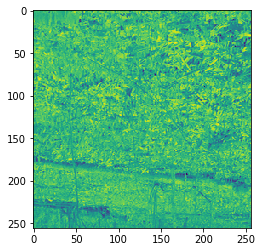

In [3]:
plt.imshow(images[10])

In [4]:
# def circle(cx, cy, rm, size):
#     x = np.arange(0,size)
#     y = np.arange(0,size)
#     mask = (x[np.newaxis,:]-cx)**2 + (y[:,np.newaxis]-cy)**2 <= r**2

In [5]:
image = images[0]

In [6]:
image.shape

(256, 256)

In [7]:
# 1) sample the points X and Y
n_points = 500
d = 20
np.random.seed(10)
xs = np.random.choice(np.arange(d,size - d), n_points, replace = True)
ys = np.random.choice(np.arange(d,size - d), n_points, replace = True)
xys = np.array(list(zip(xs, ys)))

In [128]:
mask_example = np.zeros_like(images[0])
mask_example[xys[0,0]-d:xys[0,0]+d, xys[0,1]-d:xys[0,1]+d] = 8
mask_example[xys[1,0]-d:xys[1,0]+d, xys[1,1]-d:xys[1,1]+d] = 8
for element in xys:
    mask_example[element[0], element[1]] = 5
mask_example[xys[0,0],xys[0,1]] = -5
mask_example[xys[1,0],xys[1,1]] = -5

Text(0, 0.5, 'Y pixels')

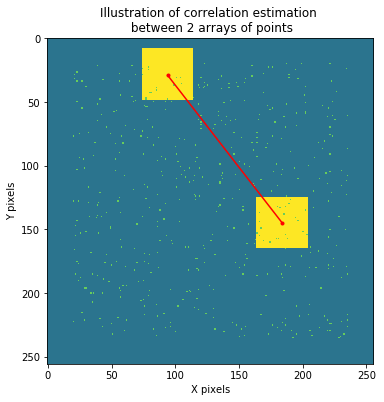

In [141]:
plt.figure(figsize = (6,6))
plt.title('Illustration of correlation estimation \n between 2 arrays of points')
plt.imshow(mask_example)
plt.plot([xys[0,1], xys[1,1]], [xys[0,0], xys[1,0]],'.-', color = 'red')
plt.xlabel('X pixels')
plt.ylabel('Y pixels')

In [8]:
# 2) Calculate pairwise distances, rxs and rys
pairwise_r = np.round(cdist(xys, xys))
rx = np.abs(xs[:,None]-xs[None,:])
ry = np.abs(ys[:,None]-ys[None,:])

In [9]:
def square(cx, cy, d, size, an_image):
    mask = np.zeros_like(an_image)
    mask[cx-d:cx+d, cy-d:cy+d] = 1
    return an_image[np.where(mask == True)]

In [23]:
iu1 = np.triu_indices(n_points,1) #select indices of upper diagonal matrix excluding diagonal
# 3.1) check if distance between ith and jth points is below 100 pixel
n_pixels = 100
iu1_selected = [(i,j) for (i,j) in list(zip(*iu1)) if pairwise_r[i,j] <= n_pixels]      

In [31]:
%%time
# 3) Calculate correlations for each pair of points

RxRy = np.zeros((n_im, n_pixels+1, n_pixels+1))
R = np.zeros((n_im, n_pixels+1))

for m in range(n_im):
    image = images[m]
    
    RxRy_correlation = np.zeros((n_pixels+1, n_pixels+1))
    RxRy_counts = np.zeros((n_pixels+1, n_pixels+1))
    R_correlation = np.zeros(n_pixels+1)
    R_counts = np.zeros(n_pixels+1)

    for (i,j) in iu1_selected:
        
        ith_array = square(xys[i,0],xys[i,1],d,size,image)
        jth_array = square(xys[j,0],xys[j,1],d,size,image)
        corr_ij,_ = pearsonr(ith_array, jth_array)

        RxRy_correlation[rx[i,j],ry[i,j]] += corr_ij
        RxRy_counts[rx[i,j],ry[i,j]] += 1

        R_correlation[int(pairwise_r[i,j])] += corr_ij
        R_counts[int(pairwise_r[i,j])] += 1
    
    with np.errstate(divide='ignore', invalid='ignore'):
        RxRy[m] = RxRy_correlation/RxRy_counts
        R[m] = R_correlation/R_counts
    np.save('Homework6_RxRy.txt', RxRy)
    np.save('Homework6_R.txt', R)
    print('Done with image ', m)

Done with image  0
Done with image  1
Done with image  2
Done with image  3
Done with image  4
Done with image  5
Done with image  6
Done with image  7
Done with image  8
Done with image  9
Done with image  10
Done with image  11
Done with image  12
Done with image  13
Done with image  14
Done with image  15
Done with image  16
Done with image  17
Done with image  18
Done with image  19
Done with image  20
Done with image  21
Done with image  22
Done with image  23
Done with image  24
Done with image  25
Done with image  26
Done with image  27
Done with image  28
Done with image  29
Done with image  30
Done with image  31
Done with image  32
Done with image  33
Done with image  34
Done with image  35
Done with image  36
Done with image  37
Done with image  38
Done with image  39
Done with image  40
Done with image  41
Done with image  42
Done with image  43
Done with image  44
CPU times: user 22min 30s, sys: 5.68 s, total: 22min 36s
Wall time: 22min 39s


In [32]:
# len(list(zip(*np.where(RxRy_correlation == 0)))) #identify those x-y/separations which are not sampled yet

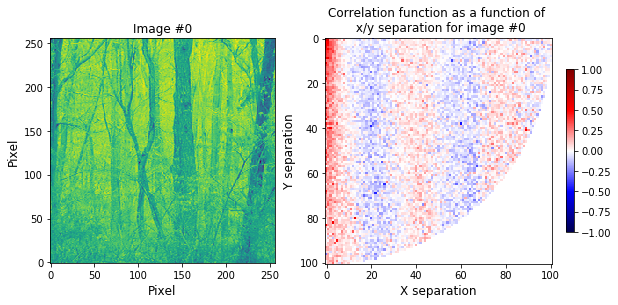

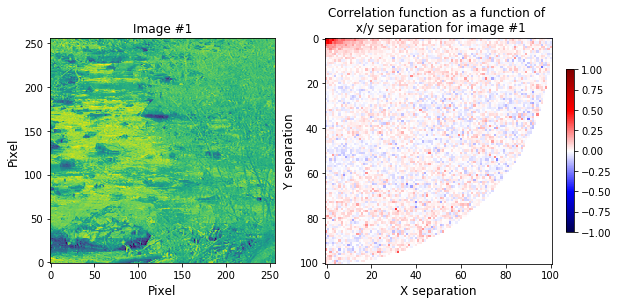

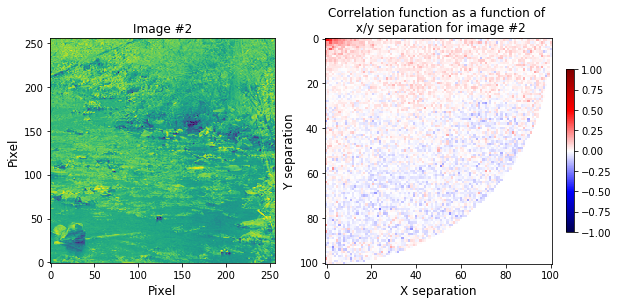

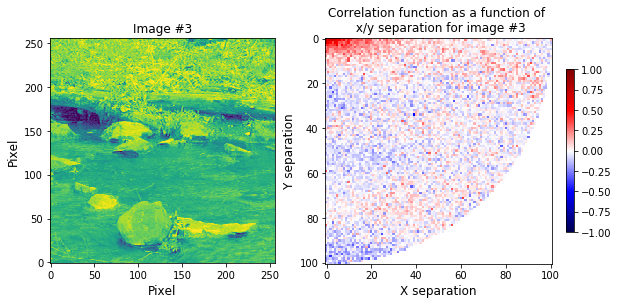

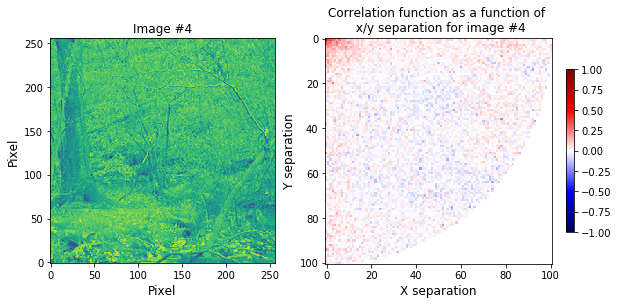

...

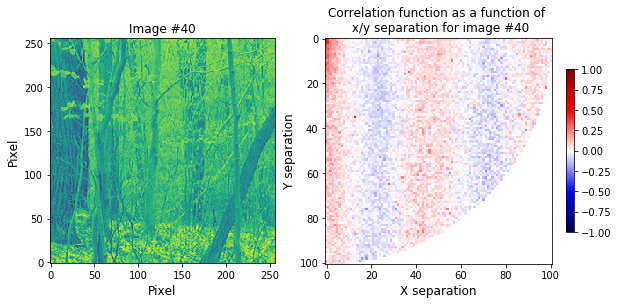

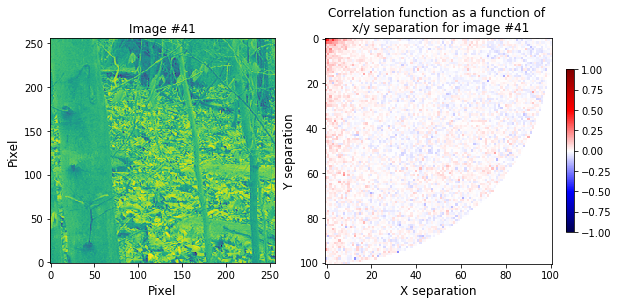

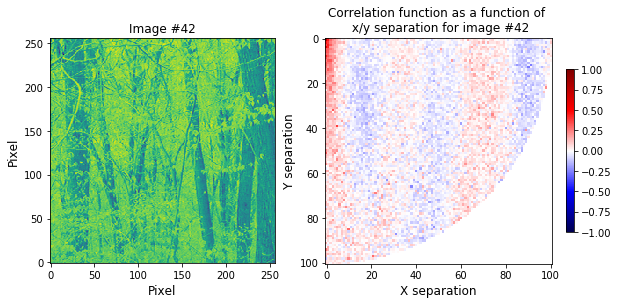

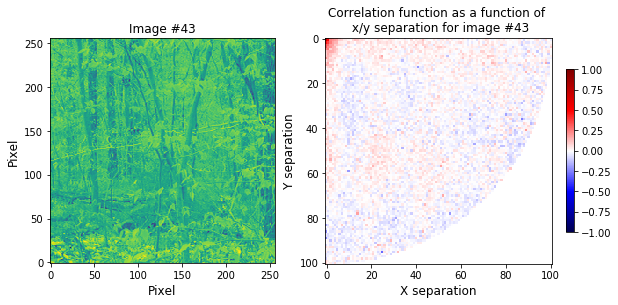

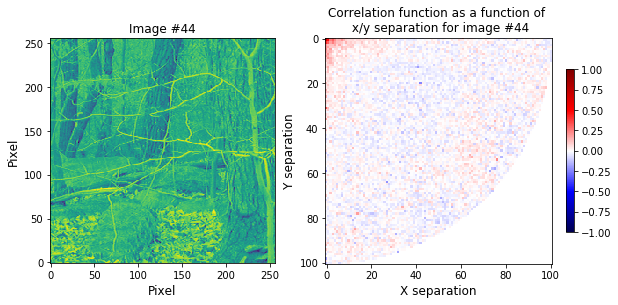

In [79]:
for i in range(n_im):
    fig, ax = plt.subplots(1, 2, figsize = (10,5), gridspec_kw={'width_ratios': [1, 1.26]})
    ax[0].set_title('Image #{}'.format(i))
    ax[0].imshow(images[i], origin = 'lower')
    ax[0].set_ylabel('Pixel', fontsize = 12)
    ax[0].set_xlabel('Pixel', fontsize = 12)
    ax[1].set_title('Correlation function as a function of \n x/y separation for image #{}'.format(i))
    im1 = ax[1].imshow(RxRy[i], cmap = 'seismic', vmin = -1, vmax = 1)
    fig.colorbar(im1, ax=ax[1], shrink=0.6)
    ax[1].set_ylabel('Y separation', fontsize = 12)
    ax[1].set_xlabel('X separation', fontsize = 12)

In [38]:
R_mean = np.mean(R, axis = 0)
R_std = np.std(R, axis = 0)

Text(0, 0.5, 'Correlation')

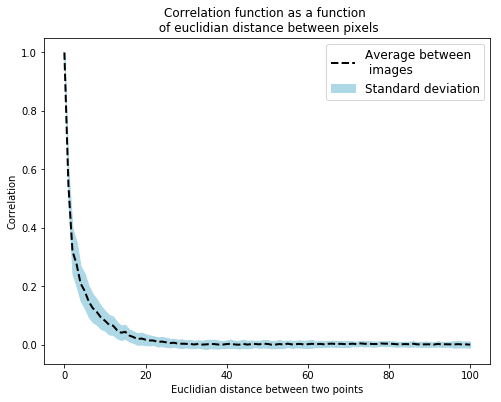

In [84]:
plt.figure(figsize = (8,6))
plt.title('Correlation function as a function \n of euclidian distance between pixels')

# for m in range(n_im):
#     plt.plot(range(n_pixels+1),R[m], alpha = 0.2)

plt.plot(range(n_pixels+1),R_mean, label = 'Average between \n images', color = 'black', 
         linewidth=2, ls = '--')
plt.fill_between(range(n_pixels+1), R_mean-R_std, R_mean+R_std, label = 'Standard deviation', alpha = 1,
                 color = 'lightblue')
plt.legend(fontsize = 12)
plt.xlabel('Euclidian distance between two points')
plt.ylabel('Correlation')